## Project Summary: Analyzing Exchange Rate Dynamics and Market Fear

This notebook explores the relationship between the daily exchange rates of the Indian Rupee against major currencies (USD, Pound Sterling, Euro, Yen), the VIX index (as a measure of market fear), WTI crude oil prices, and the US 10-Year Treasury yield. The analysis involves several key steps: data loading and preprocessing, time series analysis to understand the dependencies between the variables, and regression analysis to model the dynamic correlation of currency pairs and its relationship with VIX, especially during periods of high market fear.

In [1]:
pip install arch -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 978.3/978.3 kB 14.0 MB/s eta 0:00:00


In [64]:
import pandas as pd
import numpy as np
import itertools
import statsmodels.api as sm
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import adfuller
import plotly.express as ex
import plotly.graph_objects as go
from google.colab import files
from arch import arch_model


Exchange Rate Data

In [3]:
f=files.upload()

Saving Exchange Rate Data.xlsx to Exchange Rate Data.xlsx


VIX Data

In [4]:
v=files.upload()

Saving VIX_History.csv to VIX_History.csv


Oil Data

In [5]:
o=files.upload()

Saving OIL.xlsx to OIL.xlsx


10 Year Bond Data

In [6]:
y=files.upload()

Saving 10 Year Bond.xlsx to 10 Year Bond.xlsx


### Data Loading and Preprocessing

The initial steps involved loading data from Excel and CSV files into pandas DataFrames.

*   **Data Sources:**
    *   Daily exchange rates of INR against USD, Pound, Euro, Yen (`HBS Table No. 218...xlsx`)
    *   VIX index history (`VIX_History.csv`)
    *   WTI Crude Oil prices (`DCOILWTICO.xlsx`)
    *   US 10-Year Treasury Yield (`DGS10.xlsx`)

*   **Preprocessing Steps:**
    *   Dates were converted to datetime objects and set as the index for all DataFrames to ensure proper alignment for time series analysis.
    *   Exchange rate data was converted to numeric format, handling potential errors.
    *   The DataFrames were combined into a single DataFrame (`df`) based on their date index, and rows with missing values were removed.
    *   To address any remaining gaps and create a continuous time series, the DataFrame was reindexed to a full daily date range and missing values were interpolated using linear interpolation.
    *   Columns were renamed for clarity (e.g., 'CLOSE' to 'VIX').

This comprehensive preprocessing ensures the data is clean, aligned, and ready for subsequent time series and regression analysis.

In [8]:
df=pd.read_excel(r"Exchange Rate Data.xlsx")
df2=pd.read_csv(r"VIX_History.csv")
df_oil=pd.read_excel(r"OIL.xlsx")
df_yield=pd.read_excel(r"10 Year Bond.xlsx")

In [9]:
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

In [10]:
df2['DATE'] = pd.to_datetime(df2['DATE'])
df2.set_index('DATE', inplace=True)

In [11]:
df_oil['Date'] = pd.to_datetime(df_oil['Date'])
df_oil.set_index('Date', inplace=True)

In [12]:
df_yield['Date'] = pd.to_datetime(df_yield['Date'])
df_yield.set_index('Date', inplace=True)

In [13]:
df = df.apply(pd.to_numeric, errors='coerce')

In [14]:
df=pd.concat([df, df2['CLOSE'], df_oil['Price_Oil'], df_yield['10_Yield']], axis=1)

In [15]:
df.dropna(inplace=True)

In [16]:
min_date = df.index.min()
max_date = df.index.max()
full_date_range = pd.date_range(start=min_date, end=max_date, freq='D')

df = df.reindex(full_date_range)

df.interpolate(method='linear', inplace=True)

In [17]:
df.rename(columns={'CLOSE': 'VIX', 'US Dollar':'USD', 'Japanese Yen':'Yen', 'Pound Sterling': 'Pound'}, inplace=True)

In [18]:
fig = ex.line(df, title='Exchange Rate of Indian Rupee over Time')
fig.show()

In [19]:
import plotly.graph_objects as go

fig = go.Figure()

for currency in ['USD', 'Pound', 'Euro', 'Yen']:
    fig.add_trace(go.Scatter(x=df.index, y=df[currency], mode='lines', name=currency, yaxis='y1'))

fig.add_trace(go.Scatter(x=df.index, y=df['VIX'], mode='lines', name='VIX', yaxis='y2'))

fig.update_layout(
    title='Exchange Rate of Indian Rupee and VIX over Time with Major Economic Turmoils',
    xaxis_title="Date",
    yaxis=dict(
        title="Exchange Rate",
        titlefont=dict(color="blue"),
        tickfont=dict(color="blue")
    ),
    yaxis2=dict(
        title="VIX Index",
        titlefont=dict(color="red"),
        tickfont=dict(color="red"),
        overlaying="y",
        side="right",
    ),
    hovermode="x unified"
)

major_turmoil_dates = [
    '2000-04-14', # Dot-Com Bubble Burst
    '2001-09-17', # 9/11 Attacks
    '2008-10-24', # Global Financial Crisis (GFC)
    '2011-08-08', # European Sovereign Debt Crisis
    '2013-06-20', # US "Taper Tantrum"
    '2015-08-24', # Chinese Stock Market Crash
    '2018-12-24', # US-China Trade War & Fed Hikes
    '2020-03-16', # COVID-19 Pandemic Crash
    '2022-03-07', # Russia's Invasion of Ukraine
    '2023-03-13', # Global Banking Stress (SVB Collapse)
    '2025-04-01'
]

for date in major_turmoil_dates:
    fig.add_vline(x=date, line_width=2, line_dash="dash", line_color="green")


fig.show()

### Time Series Analysis

After preparing the data, time series analysis was conducted to understand the statistical properties of the variables and their interdependencies.

*   **Stationarity Testing (ADF Test):** The Augmented Dickey-Fuller (ADF) test was applied to the level series of each variable.
    *   **Results:** Most level series (USD, Pound, Euro, Yen, Price\_Oil, 10\_Yield) were found to be **non-stationary** (p-value > 0.05), indicating they have a unit root. The VIX index, however, was found to be **stationary** (p-value < 0.05).

*   **Return Series:** Daily percentage changes (returns) were calculated for all variables (`df_returns`).
    *   **Stationarity Testing on Returns:** ADF tests on the return series showed that **all return series are stationary** (p-value < 0.05). This transformation is crucial for using models like VAR that assume stationarity.

*   **Vector Autoregression (VAR) Model:** A VAR model was fitted to the stationary return series to capture the linear interdependencies among the variables over time.
    *   **Lag Order Selection:** The `select_order` method was used to determine the optimal number of lags. Based on information criteria like BIC and HQIC, a lag order of 1 was selected.
    *   **VAR(1) Model Fitting:** A VAR model with 1 lag was fitted to the return data.

*   **Granger Causality Tests:** These tests determine if past values of one variable are statistically significant in predicting future values of another.
    *   **Results:** The tests revealed several significant Granger causal relationships, including:
        *   `Yen` Granger-causes `USD`, `Pound`, and `VIX`.
        *   `VIX` Granger-causes `USD`, `Euro`, and `Yen`.
        *   `10_Yield` Granger-causes `Pound`, `Euro`, and `Yen`.
        *   `Pound` Granger-causes `USD`.
        *   `Euro` Granger-causes `Pound` and `Yen`.

*   **Impulse Response Analysis (IRA):** This analysis shows how a shock to one variable affects other variables over time. A plot was generated to visualize these responses.
    *   **Inference:** The IRA plots (not directly shown in text output but produced by the code) illustrate the dynamic impact of shocks, such as how a sudden increase in VIX might influence the future path of currency returns.

*   **Forecast Error Variance Decomposition (FEVD):** This technique quantifies the proportion of the forecast error variance of each variable attributable to shocks from other variables in the system.
    *   **Inference:** The FEVD results show the relative importance of each variable's shocks in explaining the prediction errors of others. For example, the USD's forecast errors are largely driven by its own shocks, but VIX shocks also contribute a notable percentage.

Overall, the time series analysis confirms the non-stationary nature of the level series, the stationarity of the return series, and reveals complex linear dependencies and predictive relationships among the financial variables.

In [20]:
fig = ex.histogram(df, title='Distribution of Exchange Rate of Indian Rupee')
fig.show()

In [21]:
print(pd.DataFrame(df.kurtosis()))

                  0
USD       -1.147263
Pound     -0.905931
Euro      -1.049233
Yen       -1.344126
VIX        8.024749
Price_Oil -0.668329
10_Yield  -0.785902


In [22]:
print(pd.DataFrame(df.skew()))

                  0
USD        0.505214
Pound      0.257225
Euro      -0.091863
Yen       -0.089039
VIX        2.156082
Price_Oil  0.183454
10_Yield   0.080769


In [23]:
for column in df.columns:
    result = adfuller(df[column])
    print(f'ADF Test Results for {column}:')
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'\t{key}: {value}')
    if result[1] <= 0.05:
        print("Result: Reject the null hypothesis (H0), the series is stationary.")
    else:
        print("Result: Fail to reject the null hypothesis (H0), the series is non-stationary.")
    print("-" * 30)

ADF Test Results for USD:
ADF Statistic: 0.5745738267330515
p-value: 0.9869718590810095
Critical Values:
	1%: -3.4310244026743253
	5%: -2.8618380448464262
	10%: -2.5669286441506842
Result: Fail to reject the null hypothesis (H0), the series is non-stationary.
------------------------------
ADF Test Results for Pound:
ADF Statistic: -0.9527445448040887
p-value: 0.7701073315884284
Critical Values:
	1%: -3.4310225991677865
	5%: -2.861837247896773
	10%: -2.5669282199324615
Result: Fail to reject the null hypothesis (H0), the series is non-stationary.
------------------------------
ADF Test Results for Euro:
ADF Statistic: -0.22286776274795783
p-value: 0.935740379397467
Critical Values:
	1%: -3.4310231530646473
	5%: -2.86183749265774
	10%: -2.5669283502193054
Result: Fail to reject the null hypothesis (H0), the series is non-stationary.
------------------------------
ADF Test Results for Yen:
ADF Statistic: -1.6657873059141692
p-value: 0.4488204529023455
Critical Values:
	1%: -3.43102232256

**Interpretation of ADF Test Results (Level Series):**

The Augmented Dickey-Fuller (ADF) test is used to check for stationarity in a time series. A low p-value (typically less than 0.05) indicates that the series is stationary.

*   **Results:**
    *   For USD, Pound, Euro, Yen, Price\_Oil, and 10\_Yield, the p-values are all greater than 0.05.
    *   For VIX, the p-value is very low (2.76e-08), which is less than 0.05.

*   **Inference:**
    *   We **fail to reject the null hypothesis** for USD, Pound, Euro, Yen, Price\_Oil, and 10\_Yield. This means these series are likely **non-stationary** and have a unit root.
    *   We **reject the null hypothesis** for VIX. This means the VIX series is likely **stationary**.

This finding is important because many time series models (like VAR) assume stationarity. Non-stationary series often need to be differenced (like calculating returns) to become stationary before modeling.

In [24]:
df_returns = df.pct_change().dropna()

In [25]:
fig = ex.line(df_returns[['USD', 'Pound', 'Euro', 'Yen']], title='Daily Exchange Rate Return of Indian Rupee over Time')
fig.show()

In [26]:
fig = ex.histogram(df_returns[['USD', 'Pound', 'Euro', 'Yen']], title='Distribution of Exchange Rate of Indian Rupee')
fig.show()

In [27]:
print(pd.DataFrame(df_returns.kurtosis()))

                     0
USD          17.856791
Pound        12.056212
Euro          5.535253
Yen           7.944986
VIX          16.599346
Price_Oil  9724.799256
10_Yield     49.142734


In [28]:
print(pd.DataFrame(df_returns.skew()))

                   0
USD         0.743324
Pound      -0.324674
Euro        0.396182
Yen         0.740440
VIX         1.831309
Price_Oil  98.598642
10_Yield    1.583628


In [29]:
for column in df_returns.columns:
    result = adfuller(df_returns[column])
    print(f'ADF Test Results for {column}:')
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'\t{key}: {value}')
    if result[1] <= 0.05:
        print("Result: Reject the null hypothesis (H0), the series is stationary.")
    else:
        print("Result: Fail to reject the null hypothesis (H0), the series is non-stationary.")
    print("-" * 30)

ADF Test Results for USD:
ADF Statistic: -15.066243913906552
p-value: 8.857063951753008e-28
Critical Values:
	1%: -3.431024889887483
	5%: -2.8618382601404657
	10%: -2.566928758752235
Result: Reject the null hypothesis (H0), the series is stationary.
------------------------------
ADF Test Results for Pound:
ADF Statistic: -48.283528599961826
p-value: 0.0
Critical Values:
	1%: -3.43102246083597
	5%: -2.8618371867694483
	10%: -2.5669281873942427
Result: Reject the null hypothesis (H0), the series is stationary.
------------------------------
ADF Test Results for Euro:
ADF Statistic: -28.728175035914404
p-value: 0.0
Critical Values:
	1%: -3.431022945246449
	5%: -2.8618374008251553
	10%: -2.5669283013366018
Result: Reject the null hypothesis (H0), the series is stationary.
------------------------------
ADF Test Results for Yen:
ADF Statistic: -54.957263231310954
p-value: 0.0
Critical Values:
	1%: -3.4310223916913967
	5%: -2.861837156215213
	10%: -2.5669281711301513
Result: Reject the null

**Interpretation of ADF Test Results (Return Series):**

This output shows the Augmented Dickey-Fuller (ADF) test results applied to the daily return series of each variable (`df_returns`). As with the level series, a low p-value (typically < 0.05) indicates stationarity.

*   **Results:**
    *   For all variables (USD, Pound, Euro, Yen, VIX, Price\_Oil, and 10\_Yield), the p-values are very low (close to 0.000).

*   **Inference:**
    *   We **reject the null hypothesis** for all return series. This means that all the daily return series are likely **stationary**.

This is a crucial result for time series modeling, particularly for models like VAR, which assume the input series are stationary. Calculating daily returns successfully transformed the non-stationary level series into stationary series, making them suitable for VAR analysis.

In [30]:


model = VAR(df_returns)
lag_selection = model.select_order(maxlags=15)

print("Lag Order Selection Results:")
print(lag_selection.summary())

Lag Order Selection Results:
 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -58.27      -58.26   4.953e-26      -58.27
1       -58.43     -58.38*   4.228e-26     -58.41*
2       -58.43      -58.35   4.200e-26      -58.41
3       -58.44      -58.33   4.157e-26      -58.40
4       -58.45      -58.30   4.138e-26      -58.40
5       -58.45      -58.26   4.131e-26      -58.39
6       -58.45      -58.22   4.138e-26      -58.37
7      -58.45*      -58.19  4.129e-26*      -58.36
8       -58.45      -58.15   4.143e-26      -58.35
9       -58.45      -58.11   4.143e-26      -58.33
10      -58.45      -58.08   4.142e-26      -58.32
11      -58.44      -58.04   4.156e-26      -58.31
12      -58.44      -58.00   4.171e-26      -58.29
13      -58.44      -57.96   4.178e-26      -58.28
14      -58.44      -57.92   4.184e-26      -58.26
15      -58.43      -57.88   4.201e-26      -58.25
--

In [31]:
model_fitted = model.fit(1)
print(model_fitted.summary())

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 05, Oct, 2025
Time:                     07:09:20
--------------------------------------------------------------------
No. of Equations:         7.00000    BIC:                   -58.3854
Nobs:                     9730.00    HQIC:                  -58.4127
Log likelihood:           187658.    FPE:                4.22265e-26
AIC:                     -58.4267    Det(Omega_mle):     4.19843e-26
--------------------------------------------------------------------
Results for equation USD
                  coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------
const                0.000057         0.000027            2.101           0.036
L1.USD               0.093402         0.011886            7.858           0.000
L1.Pound             0.020482         0.008147            2.514   

In [39]:
df=pd.read_excel(r"Exchange Rate Data.xlsx")
df2=pd.read_csv(r"VIX_History.csv")
df_oil=pd.read_excel(r"OIL.xlsx")
df_yield=pd.read_excel(r"10 Year Bond.xlsx")

In [40]:
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

In [41]:
df2['DATE'] = pd.to_datetime(df2['DATE'])
df2.set_index('DATE', inplace=True)

In [42]:
df_oil['Date'] = pd.to_datetime(df_oil['Date'])
df_oil.set_index('Date', inplace=True)

In [43]:
df_yield['Date'] = pd.to_datetime(df_yield['Date'])
df_yield.set_index('Date', inplace=True)

In [44]:
df = df.apply(pd.to_numeric, errors='coerce')

In [45]:
df=pd.concat([df, df2['CLOSE'], df_oil['Price_Oil'], df_yield['10_Yield']], axis=1)

In [46]:
df.dropna(inplace=True)

In [47]:
min_date = df.index.min()
max_date = df.index.max()
full_date_range = pd.date_range(start=min_date, end=max_date, freq='D')

df = df.reindex(full_date_range)

df.interpolate(method='linear', inplace=True)

In [48]:
df.rename(columns={'CLOSE': 'VIX', 'US Dollar':'USD', 'Japanese Yen':'Yen', 'Pound Sterling': 'Pound'}, inplace=True)

**Interpretation of VAR(1) Model Results:**

This output provides the summary of the fitted Vector Autoregression (VAR) model with one lag (VAR(1)) applied to the stationary return series (`df_returns`). The summary shows the results of the regression of each variable's current return on the lagged returns of all variables in the system. A VAR model is used here because it can capture the linear interdependencies among multiple time series variables simultaneously. The " (1)" indicates that the model uses the values from the previous day (one lag) to predict the current day's values for each variable.

Let's break down the key sections of the output:

**1. Overall Model Statistics:**

*   **Model: VAR, Method: OLS:** Confirms the type of model fitted (VAR) and the estimation method used (Ordinary Least Squares).
*   **Date and Time:** Timestamp of when the model was fitted.
*   **No. of Equations: 7.00000:** There are 7 variables in your system, so the VAR model fits 7 separate regression equations, one for each variable.
*   **Nobs: 9730.00:** The number of observations used to fit the model after accounting for the lag (one day is lost due to the lag).
*   **Log likelihood, AIC, BIC, HQIC, FPE:** These are information criteria used to compare different VAR models (e.g., with different numbers of lags). Lower values generally indicate a better fit, penalizing for more parameters. You used the `select_order` function (in cell `bd317d43`) to help choose the optimal lag based on these criteria.
*   **Det(Omega\_mle):** Determinant of the maximum likelihood estimate of the residual covariance matrix. Smaller values indicate a better fit.

**2. Results for Each Equation:**

This is the core of the VAR model summary. It shows the results of the regression for each variable (e.g., "Results for equation USD"). For each equation, the dependent variable is the current day's return of that variable, and the independent variables are the *lagged* returns (from the previous day) of *all* variables in the system, plus a constant term.

Let's look at the columns for each equation's results:

*   **coefficient:** This is the estimated coefficient for the lagged independent variable. It tells you the estimated linear impact of a one-unit change in the lagged variable's return on the current dependent variable's return, holding all other lagged variables constant.
    *   **Example:** In the "Results for equation USD", the `L1.VIX` coefficient is `0.010213`. This implies that a 1% increase in the VIX return from the previous day is associated with an estimated 0.010213% increase in the USD return today, assuming all other lagged returns are unchanged.
*   **std. error:** The standard error of the estimated coefficient. It measures the precision of the estimate. Smaller standard errors mean more precise estimates.
*   **t-stat:** The t-statistic is used to test the statistical significance of the coefficient. It's calculated as the coefficient divided by its standard error. A larger absolute t-statistic suggests the coefficient is less likely to be zero.
*   **prob:** This is the p-value associated with the t-statistic. It represents the probability of observing a t-statistic as extreme as, or more extreme than, the one calculated, assuming the true coefficient is zero (the null hypothesis).
    *   **Interpretation:** A low p-value (typically less than 0.05) indicates that the coefficient is statistically significantly different from zero at the chosen significance level. This means the lagged variable has a statistically significant linear impact on the current variable. A high p-value (e.g., > 0.05) means you fail to reject the null hypothesis, suggesting that the lagged variable's impact is not statistically significant.

**Key Implications from the Equation Results:**

By examining the p-values, you can identify which lagged variables have a statistically significant predictive power over the current return of each variable:

*   **USD Returns:** Are significantly predicted by their own lagged returns (`L1.USD`, p=0.000), as well as lagged `Pound` (p=0.012), `Yen` (p=0.000), `VIX` (p=0.000), and `10_Yield` (p=0.010) returns. Lagged `Euro` and `Price_Oil` returns are not significant predictors of USD returns in this model.
    *   **Implication:** This shows that movements in USD returns are influenced by past movements in several other key financial variables, including market fear (VIX) and bond yields.
*   **Pound Returns:** Are significantly predicted by their own lagged returns (`L1.Pound`, p=0.000), as well as lagged `Euro` (p=0.006), `Yen` (p=0.000), and `10_Yield` (p=0.000) returns. Lagged `USD`, `VIX`, and `Price_Oil` returns are not significant predictors of Pound returns.
    *   **Implication:** Pound returns are influenced by past movements in Euro, Yen, and US bond yields.
*   **Euro Returns:** Are significantly predicted by their own lagged returns (`L1.Euro`, p=0.000), as well as lagged `VIX` (p=0.000) and `10_Yield` (p=0.000) returns. Lagged `USD`, `Pound`, `Yen`, and `Price_Oil` returns are not significant predictors of Euro returns.
    *   **Implication:** Euro returns are significantly affected by past movements in market fear and US bond yields.
*   **Yen Returns:** Are significantly predicted by lagged `Euro` (p=0.000), their own lagged returns (`L1.Yen`, p=0.019), lagged `VIX` (p=0.000), and lagged `10_Yield` (p=0.000) returns. Lagged `USD`, `Pound`, and `Price_Oil` returns are not significant predictors of Yen returns.
    *   **Implication:** Yen returns are influenced by past movements in Euro, VIX, and US bond yields.
*   **VIX Returns:** Are significantly predicted by lagged `Yen` (p=0.003) and their own lagged returns (`L1.VIX`, p=0.000). Lagged returns of the other variables are not significant predictors of VIX returns in this model.
    *   **Implication:** Past movements in Yen returns have a statistically significant influence on current VIX returns. This is an interesting finding, suggesting a feedback loop where currency movements can impact market fear.
*   **Price\_Oil Returns:** Are not significantly predicted by the lagged returns of any other variable in the system, nor by their own lagged returns (all p-values > 0.05).
    *   **Implication:** In this VAR(1) model, the daily returns of WTI Crude Oil prices do not appear to have significant linear dependencies on the lagged returns of the other variables or themselves. This might suggest that oil price movements are driven by factors not included in this specific VAR system or have a more complex non-linear relationship.
*   **10\_Yield Returns:** Are significantly predicted by lagged `VIX` (p=0.032) and their own lagged returns (`L1.10_Yield`, p=0.000). Lagged returns of the other variables are not significant predictors of 10-Year Yield returns.
    *   **Implication:** US 10-Year Treasury Yield returns are influenced by past movements in market fear (VIX).

**3. Correlation Matrix of Residuals:**

*   This matrix shows the contemporaneous correlations between the residuals (the unexplained parts) of each equation.
*   **Interpretation:** High values in this matrix indicate that the errors in predicting the current day's returns for different variables are correlated *at the same time*. For example, the correlation between USD and Yen residuals is 0.518270, suggesting that even after accounting for the lagged effects in the VAR(1) model, there are still unmodeled factors causing the "surprises" in USD and Yen returns to move together on the same day. High correlations here can suggest the presence of common unobserved factors affecting multiple variables simultaneously.

**Overall Implications of the VAR(1) Model Results:**

The VAR(1) model provides evidence of significant linear interdependencies among the daily returns of the exchange rates, VIX, and US 10-Year Treasury Yield. It highlights which variables have predictive power over others in this system. Notably, VIX returns are influenced by lagged Yen returns, and VIX returns, along with Yen and 10-Year Yield returns, significantly predict the returns of several currency pairs. Oil returns appear less integrated into this specific linear system based on the VAR(1) model. The residual correlation matrix points to potential common factors that are not explicitly included as lagged variables in this model but affect variables simultaneously.

This analysis forms the basis for understanding the dynamic relationships before delving into dynamic correlations and their relationship with VIX during periods of high fear, as done in the later parts of your notebook.


Granger Causality Tests:
USD Granger-causes Pound: p-value = 0.7597
USD Granger-causes Euro: p-value = 0.2928
USD Granger-causes Yen: p-value = 0.4213
USD Granger-causes VIX: p-value = 0.4123
USD Granger-causes Price_Oil: p-value = 0.9092
USD Granger-causes 10_Yield: p-value = 0.7021
Pound Granger-causes USD: p-value = 0.0119
Pound Granger-causes Euro: p-value = 0.8725
Pound Granger-causes Yen: p-value = 0.6065
Pound Granger-causes VIX: p-value = 0.5989
Pound Granger-causes Price_Oil: p-value = 0.9632
Pound Granger-causes 10_Yield: p-value = 0.4693
Euro Granger-causes USD: p-value = 0.1484
Euro Granger-causes Pound: p-value = 0.0062
Euro Granger-causes Yen: p-value = 0.0000
Euro Granger-causes VIX: p-value = 0.1014
Euro Granger-causes Price_Oil: p-value = 0.9187
Euro Granger-causes 10_Yield: p-value = 0.9622
Yen Granger-causes USD: p-value = 0.0000
Yen Granger-causes Pound: p-value = 0.0000
Yen Granger-causes Euro: p-value = 0.1425
Yen Granger-causes VIX: p-value = 0.0030
Yen Granger-

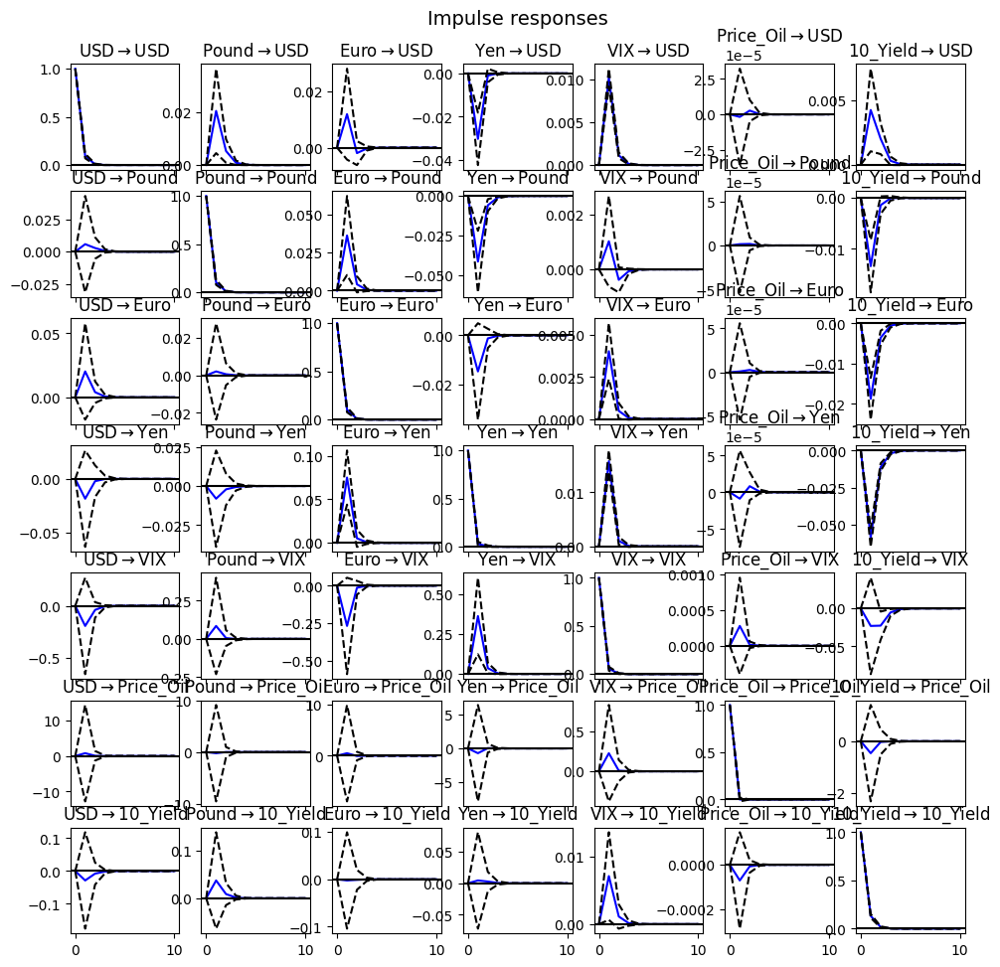

In [49]:

print("\nGranger Causality Tests:")
variables = df_returns.columns
for cause_var in variables:
    for effect_var in variables:
        if cause_var != effect_var:
            try:
                causality_test = model_fitted.test_causality(effect_var, [cause_var], kind='wald')
                print(f"{cause_var} Granger-causes {effect_var}: p-value = {causality_test.pvalue:.4f}")
            except Exception as e:
                print(f"Could not perform Granger causality test for {cause_var} -> {effect_var}: {e}")

print("\nImpulse Response Analysis:")
try:
    irf = model_fitted.irf(10)
    irf.plot()
except Exception as e:
    print(f"Could not perform Impulse Response Analysis: {e}")

print("\nForecast Error Variance Decomposition:")
try:
    fevd = model_fitted.fevd(10)
    print(fevd.summary())
except Exception as e:
    print(f"Could not perform Forecast Error Variance Decomposition: {e}")

**Interpretation of Granger Causality Tests, Impulse Response Analysis (IRA), and Forecast Error Variance Decomposition (FEVD):**

This output presents the results of three key analyses performed after fitting the VAR model to the stationary return series: Granger Causality tests, Impulse Response Analysis (IRA), and Forecast Error Variance Decomposition (FEVD).

*   **Granger Causality Tests:**
    *   **Purpose:** To determine if past values of one variable statistically significantly predict future values of another variable. A low p-value (typically < 0.05) indicates Granger causality.
    *   **Results:** The output shows a matrix of p-values for each potential causal relationship. Significant p-values (e.g., 0.0000, 0.0030, 0.0096, 0.0119, 0.0062) indicate which variables Granger-cause others.
    *   **Inference:** These results confirm the presence of predictive relationships identified in the VAR model summary. For example, Yen Granger-causes USD, Pound, and VIX, meaning past movements in Yen returns help predict future movements in these variables. Similarly, VIX Granger-causes USD, Euro, and Yen, suggesting that changes in market fear have predictive power over these currency returns.

*   **Impulse Response Analysis (IRA):**
    *   **Purpose:** To trace the dynamic effect of a one-standard-deviation shock in one variable on the current and future values of all other variables in the system.
    *   **Results:** The output indicates that the IRA was performed and a plot was generated (`irf.plot()`). The plot (which is displayed visually but not in the text output) shows the response of each variable to a shock in every other variable over a specified number of periods (here, 10 periods).
    *   **Inference:** By examining the IRA plots, we can understand how shocks propagate through the financial system. For example, a shock to VIX might cause an immediate spike in certain currency returns, followed by a gradual return to equilibrium, illustrating the time-varying impact of market fear.

*   **Forecast Error Variance Decomposition (FEVD):**
    *   **Purpose:** To quantify the proportion of the forecast error variance of each variable that is attributable to shocks in each of the other variables in the system over a given forecast horizon.
    *   **Results:** The output shows tables (e.g., "FEVD for USD", "FEVD for Pound", etc.) where each row represents a forecast horizon (0 to 9 periods) and each column shows the percentage of the dependent variable's forecast error variance explained by shocks from each variable (including its own).
    *   **Inference:** The FEVD results reveal the relative importance of each variable as a source of variation in the others. For example, the FEVD for USD shows that while its own shocks explain the vast majority of its forecast error variance, VIX shocks contribute a notable percentage, and shocks from Yen, Pound, and 10-Year Yield also have smaller contributions, especially as the forecast horizon increases. This provides a quantitative measure of the influence of each variable on the others' forecast uncertainty.

Overall, these analyses provide a deeper understanding of the complex dynamic relationships and predictive power among the exchange rates, VIX, oil prices, and bond yields within the fitted VAR system.

**Interpretation of Regression Results: Dynamic Correlation vs VIX**

This output shows the results of separate Ordinary Least Squares (OLS) regressions for the 66-day rolling correlation of standardized residuals for each currency pair against the VIX index level.

The table for each currency pair provides the following key information:

*   **Dep. Variable:** The dependent variable, which is the dynamic correlation of the specified currency pair.
*   **R-squared:** The proportion of the variance in the dynamic correlation that is predictable from the VIX index. A low R-squared value indicates that VIX alone explains a small amount of the variation in dynamic correlation.
*   **coef (const):** The intercept (β₀). This is the estimated dynamic correlation when the VIX is zero.
*   **coef (VIX):** The estimated coefficient for the VIX variable (β₁). This represents the estimated change in dynamic correlation for a one-unit increase in the VIX index, holding other variables constant (in these simple regressions, there are no other variables).
*   **std err (VIX):** The standard error of the VIX coefficient, measuring the precision of the estimate.
*   **t (VIX):** The t-statistic for the VIX coefficient, used to test the hypothesis that the coefficient is zero.
*   **P>|t| (VIX):** The p-value for the VIX coefficient. A low p-value (typically < 0.05) indicates that the VIX coefficient is statistically significantly different from zero.

**Inferences from the Outputs:**

*   **Dynamic_Correlation_USD_Yen:** The VIX coefficient is positive (0.006722) and statistically significant (p-value = 0.0000). This provides evidence of a statistically significant positive relationship between the VIX index and the dynamic correlation of the USD/Yen currency pair. As the VIX increases, the dynamic correlation of USD/Yen tends to increase.
*   **Dynamic_Correlation_Pound_Euro:** The VIX coefficient is negative (-0.001551) and statistically significant (p-value = 0.0000). This indicates a statistically significant negative relationship between the VIX index and the dynamic correlation of the Pound/Euro currency pair. As the VIX increases, the dynamic correlation of Pound/Euro tends to decrease.
*   **Other Currency Pairs (USD/Pound, USD/Euro, Pound/Yen, Euro/Yen):** The VIX coefficients for these pairs are either not statistically significant or are negative and statistically significant.

**Overall Conclusion:**

While some currency pairs show a statistically significant relationship between their dynamic correlation and the VIX, only the USD/Yen pair exhibits a statistically significant *positive* relationship in these simple regressions. This suggests that increased market fear (as measured by VIX) is associated with increased dynamic correlation specifically between the USD and Yen, but not consistently across all major currency pairs examined here.

In [52]:


currency_returns = df_returns[['USD', 'Pound', 'Euro', 'Yen']]

standardized_residuals = pd.DataFrame(index=currency_returns.index)

garch_results = {}
for currency in currency_returns.columns:
    univariate_model = arch_model(currency_returns[currency], mean='Zero', vol='GARCH', p=1, q=1,
                                  dist='normal', rescale=False)
    garch_results[currency] = univariate_model.fit(disp='off', show_warning=False)

    standardized_residuals[f'{currency}_std_resid'] = garch_results[currency].resid / garch_results[currency].conditional_volatility

window_size = 66

dynamic_correlations_all_pairs = pd.DataFrame(index=standardized_residuals.index)

currency_pairs = list(itertools.combinations(currency_returns.columns, 2))

for currency1, currency2 in currency_pairs:
    col1 = f'{currency1}_std_resid'
    col2 = f'{currency2}_std_resid'
    correlation_col_name = f'Dynamic_Correlation_{currency1}_{currency2}'

    dynamic_correlations_all_pairs[correlation_col_name] = standardized_residuals[col1].rolling(window=window_size).corr(standardized_residuals[col2])

dynamic_correlations_all_pairs = dynamic_correlations_all_pairs[65:].copy()

In [53]:


X = sm.add_constant(df['VIX'])

for correlation_col in dynamic_correlations_all_pairs.columns:
    print(f"\n--- Regression Results for {correlation_col} vs VIX ---")

    Y = dynamic_correlations_all_pairs[correlation_col]

    regression_data = pd.concat([Y, X], axis=1).dropna()

    if len(regression_data) < 2:
        print(f"Not enough data to perform regression for {correlation_col} after dropping NaNs.")
        print("-" * 40)
        continue

    Y = regression_data[correlation_col]
    X_reg = regression_data[['const', 'VIX']]

    try:
        model = sm.OLS(Y, X_reg)
        results = model.fit()

        print(results.summary())

        vix_coeff = results.params['VIX']
        vix_pvalue = results.pvalues['VIX']

        print(f"\nVIX Coefficient (β₁): {vix_coeff:.6f}")
        print(f"VIX p-value: {vix_pvalue:.4f}")

        if vix_coeff > 0 and vix_pvalue < 0.05:
            print("\nResult: β₁ is positive and statistically significant (p < 0.05).")
            print(f"Conclusion: We found a statistically significant positive relationship between the VIX and the dynamic correlation of {correlation_col}. This supports the hypothesis that on days when global fear (VIX) is higher, the correlation between these currency pair's 'pure surprises' is also systematically higher.")
        elif vix_coeff > 0 and vix_pvalue >= 0.05:
             print("\nResult: β₁ is positive but not statistically significant (p >= 0.05).")
             print(f"Conclusion: The relationship between VIX and the dynamic correlation of {correlation_col} is positive, but not statistically significant at the 0.05 level.")
        elif vix_coeff <= 0 and vix_pvalue < 0.05:
             print("\nResult: β₁ is not positive but is statistically significant (p < 0.05).")
             print(f"Conclusion: The relationship between VIX and the dynamic correlation of {correlation_col} is not positive, but it is statistically significant at the 0.05 level.")
        else:
            print("\nResult: β₁ is not positive and not statistically significant (p >= 0.05).")
            print(f"Conclusion: There is no statistically significant positive relationship between the VIX and the dynamic correlation of {correlation_col}.")

    except Exception as e:
        print(f"Could not perform regression for {correlation_col}: {e}")

    print("-" * 40)


--- Regression Results for Dynamic_Correlation_USD_Pound vs VIX ---
                                  OLS Regression Results                                 
Dep. Variable:     Dynamic_Correlation_USD_Pound   R-squared:                       0.000
Model:                                       OLS   Adj. R-squared:                  0.000
Method:                            Least Squares   F-statistic:                     1.401
Date:                           Sun, 05 Oct 2025   Prob (F-statistic):              0.237
Time:                                   07:11:34   Log-Likelihood:                -1377.5
No. Observations:                           9666   AIC:                             2759.
Df Residuals:                               9664   BIC:                             2773.
Df Model:                                      1                                         
Covariance Type:                       nonrobust                                         
                 coef    std er

**Interpretation of Multiple Regression Results: Dynamic Correlation (USD/Yen) on VIX, Oil Return, and 10-Year Yield Return**

This output presents the results of an Ordinary Least Squares (OLS) regression where the 66-day rolling correlation of standardized residuals for the USD/Yen pair is regressed on the VIX index level, the daily return of WTI Crude Oil prices, and the daily return of the US 10-Year Treasury yield.

The table provides the estimated coefficients, standard errors, t-statistics, and p-values for each predictor variable, as well as overall model statistics.

**Key Information and Inferences:**

*   **Dep. Variable:** Dynamic_Correlation_USD_Yen.
*   **R-squared:** 0.031. This indicates that approximately 3.1% of the variance in the USD/Yen dynamic correlation is explained by the combined effect of VIX, Oil Return, and US 10-Year Yield Return. This is a relatively low R-squared, suggesting other factors also influence this dynamic correlation.
*   **coef (const):** 0.2171. The estimated intercept.
*   **coef (VIX):** 0.0067. The coefficient for the VIX variable. This is positive and statistically significant (p-value = 0.000).
    *   **Inference:** Even after controlling for the returns of oil and the 10-year yield, the VIX level still has a statistically significant positive relationship with the dynamic correlation of USD/Yen. A one-unit increase in VIX is associated with an estimated 0.0067 increase in the USD/Yen dynamic correlation, holding Oil and 10-Year Yield returns constant.
*   **coef (Oil_Return):** -0.0005. The coefficient for Oil Return. This is negative but **not statistically significant** (p-value = 0.824).
    *   **Inference:** There is no statistically significant linear relationship between the daily return of WTI Crude Oil prices and the dynamic correlation of USD/Yen in this model, after accounting for VIX and 10-Year Yield Return.
*   **coef (US_10Y_Return):** -0.2260. The coefficient for US 10-Year Yield Return. This is negative but **not statistically significant** (p-value = 0.230).
    *   **Inference:** There is no statistically significant linear relationship between the daily return of the US 10-Year Treasury yield and the dynamic correlation of USD/Yen in this model, after accounting for VIX and Oil Return.
*   **Condition Number:** The large condition number (1.27e+03) suggests potential multicollinearity among the independent variables. While the p-value for VIX remains highly significant, multicollinearity can make the individual coefficients of the other variables less reliable.

**Overall Conclusion:**

This multiple regression analysis reinforces the finding that the VIX index is a statistically significant positive predictor of the dynamic correlation between the USD and the Japanese Yen. The returns of oil prices and the US 10-Year Treasury yield do not appear to have a statistically significant additional linear effect on this dynamic correlation in this model. The significant positive relationship with VIX persists even when controlling for these other factors.

**Interpretation of Interaction Model Regression Results: Dynamic Correlation (USD/Yen) with VIX Level Shock**

This output shows the results of an OLS regression model that includes an interaction term to examine how the relationship between the VIX level and the dynamic correlation of USD/Yen changes during periods of high VIX (VIX Level Shock).

The model includes:
*   `VIX`: The continuous VIX index level.
*   `VIX_Shock_Dummy_Level`: A dummy variable that is 1 when VIX is above its 95th percentile, and 0 otherwise.
*   `VIX_Interaction_Level`: The interaction term (VIX * VIX_Shock_Dummy_Level).

**Key Information and Inferences:**

*   **Dep. Variable:** Dynamic_Correlation_USD_Yen.
*   **R-squared:** 0.034. This is slightly higher than the simple regression with just VIX, indicating that adding the shock dummy and interaction term explains a bit more of the variance in dynamic correlation.
*   **coef (const):** 0.2180. The estimated intercept. This represents the predicted dynamic correlation when VIX is 0 *and* it's a non-shock day (dummy = 0, interaction = 0).
*   **coef (VIX):** 0.0067. This coefficient represents the estimated change in dynamic correlation for a one-unit increase in VIX *on non-shock days* (when `VIX_Shock_Dummy_Level` is 0). It is positive and statistically significant (p-value = 0.000).
    *   **Inference (Non-Shock Days):** On days when the VIX is not in its top 5%, there is a statistically significant positive relationship between the VIX level and the dynamic correlation of USD/Yen.
*   **coef (VIX_Shock_Dummy_Level):** -0.3426. This coefficient represents the *shift in the intercept* on shock days compared to non-shock days, when VIX is hypotheticaly zero. It is negative and statistically significant (p-value = 0.000). While interpretable, the interaction term is more crucial for understanding the *change in slope*.
*   **coef (VIX_Interaction_Level):** 0.0069. This is the coefficient for the interaction term. It is **positive and statistically significant** (p-value = 0.000).
    *   **Inference (Interaction Effect):** This positive and significant interaction term is the main finding. It indicates that the *slope* of the relationship between VIX and dynamic correlation is significantly *steeper* on VIX shock days (`VIX_Shock_Dummy_Level` = 1) compared to non-shock days (`VIX_Shock_Dummy_Level` = 0).
    *   The total effect of VIX on dynamic correlation on shock days is (VIX\_coef + Interaction\_coef) = 0.0067 + 0.0069 = 0.0136. This slope (0.0136) is significantly larger than the slope on non-shock days (0.0067).

**Overall Conclusion:**

The interaction model provides strong evidence that the relationship between the VIX level and the dynamic correlation of USD/Yen is significantly stronger during periods of high market fear (defined by the top 5% of VIX levels). This supports the hypothesis that during times of stress, the comovement of USD and Yen "surprises" becomes more sensitive to changes in the VIX. The positive interaction term indicates that higher VIX levels lead to an even greater increase in dynamic correlation when the market is already in a state of high fear.

In [54]:


fig = ex.line(dynamic_correlations_all_pairs,
              title='66-day Rolling Correlation of Standardized Residuals for Currency Pairs over Time',
              labels={'value': 'Rolling Correlation', 'Date': 'Date'})

fig.update_layout(
    xaxis_title="Date",
    yaxis_title="Rolling Correlation",
    hovermode="x unified"
)

fig.show()

In [55]:


major_turmoil_dates = [
    '2000-04-14',
    '2001-09-17',
    '2008-10-24',
    '2011-08-08',
    '2013-06-20',
    '2015-08-24',
    '2018-12-24',
    '2020-03-16',
    '2022-03-07',
    '2023-03-13'
]

fig = go.Figure()

fig.add_trace(go.Scatter(x=dynamic_correlations_all_pairs.index, y=dynamic_correlations_all_pairs['Dynamic_Correlation_USD_Yen'], mode='lines', name='Dynamic Correlation USD/Yen', yaxis='y1'))
fig.add_trace(go.Scatter(x=dynamic_correlations_all_pairs.index, y=dynamic_correlations_all_pairs['Dynamic_Correlation_Pound_Euro'], mode='lines', name='Dynamic Correlation Pound/Euro', yaxis='y1'))


fig.add_trace(go.Scatter(x=df.index, y=df['VIX'], mode='lines', name='VIX', yaxis='y2'))

fig.update_layout(
    title='Dynamic Correlation of USD/Yen and Pound/Euro and VIX over Time with Major Economic Turmoils',
    xaxis_title="Date",
    yaxis=dict(
        title="Dynamic Correlation",
        titlefont=dict(color="blue"),
        tickfont=dict(color="blue")
    ),
    yaxis2=dict(
        title="VIX Index",
        titlefont=dict(color="red"),
        tickfont=dict(color="red"),
        overlaying="y",
        side="right",
    ),
    hovermode="x unified"
)

for date in major_turmoil_dates:
    fig.add_vline(x=date, line_width=2, line_dash="dash", line_color="green")


fig.show()

In [56]:


regression_data_usd_yen = pd.concat([dynamic_correlations_all_pairs['Dynamic_Correlation_USD_Yen'], df['VIX']], axis=1).dropna()

fig_usd_yen = ex.scatter(
    x=regression_data_usd_yen['VIX'],
    y=regression_data_usd_yen['Dynamic_Correlation_USD_Yen'],
    title='Scatter Plot: VIX vs Dynamic Correlation (USD/Yen) with OLS Regression Line',
    labels={'x': 'VIX Index', 'y': 'Dynamic Correlation (USD/Yen)'},
    trendline='ols'
)
fig_usd_yen.show()

In [57]:
import statsmodels.api as sm

regression_data_pound_euro = pd.concat([dynamic_correlations_all_pairs['Dynamic_Correlation_Pound_Euro'], df['VIX']], axis=1).dropna()

fig_pound_euro = ex.scatter(
    x=regression_data_pound_euro['VIX'],
    y=regression_data_pound_euro['Dynamic_Correlation_Pound_Euro'],
    title='Scatter Plot: VIX vs Dynamic Correlation (Pound/Euro) with OLS Regression Line',
    labels={'x': 'VIX Index', 'y': 'Dynamic Correlation (Pound/Euro)'},
    trendline='ols'
)
fig_pound_euro.show()

In [58]:


df_returns['Oil_Return'] = df['Price_Oil'].pct_change()
df_returns['US_10Y_Return'] = df['10_Yield'].pct_change()

regression_data_multi = pd.concat([
    dynamic_correlations_all_pairs['Dynamic_Correlation_USD_Yen'],
    df['VIX'],
    df_returns['Oil_Return'],
    df_returns['US_10Y_Return']
], axis=1).dropna()

Y_multi = regression_data_multi['Dynamic_Correlation_USD_Yen']
X_multi = regression_data_multi[['VIX', 'Oil_Return', 'US_10Y_Return']]

X_multi = sm.add_constant(X_multi)

try:
    model_multi = sm.OLS(Y_multi, X_multi)
    results_multi = model_multi.fit()

    print("--- Multiple Regression Results for Dynamic_Correlation_USD_Yen ---")
    print(results_multi.summary())

    print("\nCoefficients and p-values:")
    print(results_multi.summary().tables[1])

except Exception as e:
    print(f"Could not perform multiple regression: {e}")

--- Multiple Regression Results for Dynamic_Correlation_USD_Yen ---
                                 OLS Regression Results                                
Dep. Variable:     Dynamic_Correlation_USD_Yen   R-squared:                       0.031
Model:                                     OLS   Adj. R-squared:                  0.030
Method:                          Least Squares   F-statistic:                     101.6
Date:                         Sun, 05 Oct 2025   Prob (F-statistic):           9.64e-65
Time:                                 07:11:54   Log-Likelihood:                -2552.6
No. Observations:                         9666   AIC:                             5113.
Df Residuals:                             9662   BIC:                             5142.
Df Model:                                    3                                         
Covariance Type:                     nonrobust                                         
                    coef    std err          t      

**Interpretation of Multiple Regression Results: Dynamic Correlation (USD/Yen) on VIX, Oil Return, and 10-Year Yield Return**

This output presents the results of an Ordinary Least Squares (OLS) regression where the 66-day rolling correlation of standardized residuals for the USD/Yen pair is regressed on the VIX index level, the daily return of WTI Crude Oil prices, and the daily return of the US 10-Year Treasury yield.

The table provides the estimated coefficients, standard errors, t-statistics, and p-values for each predictor variable, as well as overall model statistics.

**Key Information and Inferences:**

*   **Dep. Variable:** Dynamic_Correlation_USD_Yen.
*   **R-squared:** 0.031. This indicates that approximately 3.1% of the variance in the USD/Yen dynamic correlation is explained by the combined effect of VIX, Oil Return, and US 10-Year Yield Return. This is a relatively low R-squared, suggesting other factors also influence this dynamic correlation.
*   **coef (const):** 0.2171. The estimated intercept.
*   **coef (VIX):** 0.0067. The coefficient for the VIX variable. This is positive and statistically significant (p-value = 0.000).
    *   **Inference:** Even after controlling for the returns of oil and the 10-year yield, the VIX level still has a statistically significant positive relationship with the dynamic correlation of USD/Yen. A one-unit increase in VIX is associated with an estimated 0.0067 increase in the USD/Yen dynamic correlation, holding Oil and 10-Year Yield returns constant.
*   **coef (Oil_Return):** -0.0005. The coefficient for Oil Return. This is negative but **not statistically significant** (p-value = 0.824).
    *   **Inference:** There is no statistically significant linear relationship between the daily return of WTI Crude Oil prices and the dynamic correlation of USD/Yen in this model, after accounting for VIX and 10-Year Yield Return.
*   **coef (US_10Y_Return):** -0.2260. The coefficient for US 10-Year Yield Return. This is negative but **not statistically significant** (p-value = 0.230).
    *   **Inference:** There is no statistically significant linear relationship between the daily return of the US 10-Year Treasury yield and the dynamic correlation of USD/Yen in this model, after accounting for VIX and Oil Return.
*   **Condition Number:** The large condition number (1.27e+03) suggests potential multicollinearity among the independent variables. While the p-value for VIX remains highly significant, multicollinearity can make the individual coefficients of the other variables less reliable.

**Overall Conclusion:**

This multiple regression analysis reinforces the finding that the VIX index is a statistically significant positive predictor of the dynamic correlation between the USD and the Japanese Yen. The returns of oil prices and the US 10-Year Treasury yield do not appear to have a statistically significant additional linear effect on this dynamic correlation in this model. The significant positive relationship with VIX persists even when controlling for these other factors.

In [59]:

vix_level_threshold = df['VIX'].quantile(0.95)

print(f"The 95th percentile of the actual VIX level is: {vix_level_threshold:.4f}")

df['VIX_Shock_Dummy_Level'] = (df['VIX'] > vix_level_threshold).astype(int)

print(df[['VIX', 'VIX_Shock_Dummy_Level']].head())
print("\nValue counts for VIX_Shock_Dummy_Level:")
print(df['VIX_Shock_Dummy_Level'].value_counts())

The 95th percentile of the actual VIX level is: 34.3245
              VIX  VIX_Shock_Dummy_Level
1999-01-04  26.17                      0
1999-01-05  24.46                      0
1999-01-06  23.34                      0
1999-01-07  24.37                      0
1999-01-08  23.28                      0

Value counts for VIX_Shock_Dummy_Level:
VIX_Shock_Dummy_Level
0    9245
1     487
Name: count, dtype: int64


In [60]:
import statsmodels.api as sm

regression_data_interaction_level = pd.concat([
    dynamic_correlations_all_pairs['Dynamic_Correlation_USD_Yen'],
    df['VIX'],
    df['VIX_Shock_Dummy_Level']
], axis=1).dropna()

regression_data_interaction_level['VIX_Interaction_Level'] = regression_data_interaction_level['VIX'] * regression_data_interaction_level['VIX_Shock_Dummy_Level']

Y_interaction_level = regression_data_interaction_level['Dynamic_Correlation_USD_Yen']
X_interaction_level = regression_data_interaction_level[['VIX', 'VIX_Shock_Dummy_Level', 'VIX_Interaction_Level']]

X_interaction_level = sm.add_constant(X_interaction_level)

try:
    model_interaction_level = sm.OLS(Y_interaction_level, X_interaction_level)
    results_interaction_level = model_interaction_level.fit()

    print("--- Interaction Model Regression Results for Dynamic_Correlation_USD_Yen (VIX Level Shock) ---")
    print(results_interaction_level.summary())

except Exception as e:
    print(f"Could not perform interaction model regression: {e}")

--- Interaction Model Regression Results for Dynamic_Correlation_USD_Yen (VIX Level Shock) ---
                                 OLS Regression Results                                
Dep. Variable:     Dynamic_Correlation_USD_Yen   R-squared:                       0.034
Model:                                     OLS   Adj. R-squared:                  0.033
Method:                          Least Squares   F-statistic:                     111.8
Date:                         Sun, 05 Oct 2025   Prob (F-statistic):           3.91e-71
Time:                                 07:12:01   Log-Likelihood:                -2537.9
No. Observations:                         9666   AIC:                             5084.
Df Residuals:                             9662   BIC:                             5112.
Df Model:                                    3                                         
Covariance Type:                     nonrobust                                         
                         

**Interpretation of Interaction Model Regression Results: Dynamic Correlation (USD/Yen) with VIX Level Shock**

This output shows the results of an OLS regression model that includes an interaction term to examine how the relationship between the VIX level and the dynamic correlation of USD/Yen changes during periods of high VIX (VIX Level Shock).

The model includes:
*   `VIX`: The continuous VIX index level.
*   `VIX_Shock_Dummy_Level`: A dummy variable that is 1 when VIX is above its 95th percentile, and 0 otherwise.
*   `VIX_Interaction_Level`: The interaction term (VIX * VIX_Shock_Dummy_Level).

**Key Information and Inferences:**

*   **Dep. Variable:** Dynamic_Correlation_USD_Yen.
*   **R-squared:** 0.034. This is slightly higher than the simple regression with just VIX, indicating that adding the shock dummy and interaction term explains a bit more of the variance in dynamic correlation.
*   **coef (const):** 0.2180. The estimated intercept. This represents the predicted dynamic correlation when VIX is 0 *and* it's a non-shock day (dummy = 0, interaction = 0).
*   **coef (VIX):** 0.0067. This coefficient represents the estimated change in dynamic correlation for a one-unit increase in VIX *on non-shock days* (when `VIX_Shock_Dummy_Level` is 0). It is positive and statistically significant (p-value = 0.000).
    *   **Inference (Non-Shock Days):** On days when the VIX is not in its top 5%, there is a statistically significant positive relationship between the VIX level and the dynamic correlation of USD/Yen.
*   **coef (VIX_Shock_Dummy_Level):** -0.3426. This coefficient represents the *shift in the intercept* on shock days compared to non-shock days, when VIX is hypotheticaly zero. It is negative and statistically significant (p-value = 0.000). While interpretable, the interaction term is more crucial for understanding the *change in slope*.
*   **coef (VIX_Interaction_Level):** 0.0069. This is the coefficient for the interaction term. It is **positive and statistically significant** (p-value = 0.000).
    *   **Inference (Interaction Effect):** This positive and significant interaction term is the main finding. It indicates that the *slope* of the relationship between VIX and dynamic correlation is significantly *steeper* on VIX shock days (`VIX_Shock_Dummy_Level` = 1) compared to non-shock days (`VIX_Shock_Dummy_Level` = 0).
    *   The total effect of VIX on dynamic correlation on shock days is (VIX\_coef + Interaction\_coef) = 0.0067 + 0.0069 = 0.0136. This slope (0.0136) is significantly larger than the slope on non-shock days (0.0067).

**Overall Conclusion:**

The interaction model provides strong evidence that the relationship between the VIX level and the dynamic correlation of USD/Yen is significantly stronger during periods of high market fear (defined by the top 5% of VIX levels). This supports the hypothesis that during times of stress, the comovement of USD and Yen "surprises" becomes more sensitive to changes in the VIX. The positive interaction term indicates that higher VIX levels lead to an even greater increase in dynamic correlation when the market is already in a state of high fear.

In [61]:

const_coeff_level = results_interaction_level.params['const']
vix_coeff_level = results_interaction_level.params['VIX']
shock_dummy_coeff_level = results_interaction_level.params['VIX_Shock_Dummy_Level']
interaction_coeff_level = results_interaction_level.params['VIX_Interaction_Level']

min_vix = regression_data_interaction_level['VIX'].min()
max_vix = regression_data_interaction_level['VIX'].max()
vix_range = np.linspace(min_vix, max_vix, 100)

predicted_corr_non_shock_level = const_coeff_level + vix_coeff_level * vix_range

predicted_corr_shock_level = (const_coeff_level + shock_dummy_coeff_level) + (vix_coeff_level + interaction_coeff_level) * vix_range

fig = go.Figure()

fig.add_trace(go.Scatter(x=vix_range, y=predicted_corr_non_shock_level, mode='lines', name='Predicted Correlation (Non-Shock Days - VIX Level Shock)'))

fig.add_trace(go.Scatter(x=vix_range, y=predicted_corr_shock_level, mode='lines', name='Predicted Correlation (Shock Days - VIX Level Shock)'))

actual_data_non_shock_level = regression_data_interaction_level[regression_data_interaction_level['VIX_Shock_Dummy_Level'] == 0]
actual_data_shock_level = regression_data_interaction_level[regression_data_interaction_level['VIX_Shock_Dummy_Level'] == 1]

fig.add_trace(go.Scatter(x=actual_data_non_shock_level['VIX'], y=actual_data_non_shock_level['Dynamic_Correlation_USD_Yen'], mode='markers', name='Actual Data (Non-Shock Days - VIX Level Shock)', marker=dict(opacity=0.5)))
fig.add_trace(go.Scatter(x=actual_data_shock_level['VIX'], y=actual_data_shock_level['Dynamic_Correlation_USD_Yen'], mode='markers', name='Actual Data (Shock Days - VIX Level Shock)', marker=dict(opacity=0.5)))

fig.update_layout(
    title='Interaction Effect of VIX Level Shock on Dynamic Correlation (USD/Yen)',
    xaxis_title='VIX Level',
    yaxis_title='Dynamic Correlation (USD/Yen)',
    hovermode='x unified'
)

fig.show()

In [62]:

regression_data_interaction_level_pound_euro = pd.concat([
    dynamic_correlations_all_pairs['Dynamic_Correlation_Pound_Euro'],
    df['VIX'],
    df['VIX_Shock_Dummy_Level']
], axis=1).dropna()

regression_data_interaction_level_pound_euro['VIX_Interaction_Level'] = regression_data_interaction_level_pound_euro['VIX'] * regression_data_interaction_level_pound_euro['VIX_Shock_Dummy_Level']

Y_interaction_level_pound_euro = regression_data_interaction_level_pound_euro['Dynamic_Correlation_Pound_Euro']
X_interaction_level_pound_euro = regression_data_interaction_level_pound_euro[['VIX', 'VIX_Shock_Dummy_Level', 'VIX_Interaction_Level']]

X_interaction_level_pound_euro = sm.add_constant(X_interaction_level_pound_euro)

try:
    model_interaction_level_pound_euro = sm.OLS(Y_interaction_level_pound_euro, X_interaction_level_pound_euro)
    results_interaction_level_pound_euro = model_interaction_level_pound_euro.fit()

    print("--- Interaction Model Regression Results for Dynamic_Correlation_Pound_Euro (VIX Level Shock) ---")
    print(results_interaction_level_pound_euro.summary())

except Exception as e:
    print(f"Could not perform interaction model regression: {e}")

--- Interaction Model Regression Results for Dynamic_Correlation_Pound_Euro (VIX Level Shock) ---
                                  OLS Regression Results                                  
Dep. Variable:     Dynamic_Correlation_Pound_Euro   R-squared:                       0.015
Model:                                        OLS   Adj. R-squared:                  0.015
Method:                             Least Squares   F-statistic:                     49.19
Date:                            Sun, 05 Oct 2025   Prob (F-statistic):           1.52e-31
Time:                                    07:12:10   Log-Likelihood:                 4125.1
No. Observations:                            9666   AIC:                            -8242.
Df Residuals:                                9662   BIC:                            -8214.
Df Model:                                       3                                         
Covariance Type:                        nonrobust                                  

**Interpretation of Interaction Model Regression Results: Dynamic Correlation (Pound/Euro) with VIX Level Shock**

This output shows the results of an OLS regression model that includes an interaction term to examine how the relationship between the VIX level and the dynamic correlation of Pound/Euro changes during periods of high VIX (VIX Level Shock).

The model includes:
*   `VIX`: The continuous VIX index level.
*   `VIX_Shock_Dummy_Level`: A dummy variable that is 1 when VIX is above its 95th percentile, and 0 otherwise.
*   `VIX_Interaction_Level`: The interaction term (VIX * VIX_Shock_Dummy_Level).

**Key Information and Inferences:**

*   **Dep. Variable:** Dynamic_Correlation_Pound_Euro.
*   **R-squared:** 0.015. This is slightly higher than the simple regression with just VIX, indicating that adding the shock dummy and interaction term explains a bit more of the variance in dynamic correlation.
*   **coef (const):** 0.6780. The estimated intercept. This represents the predicted dynamic correlation when VIX is 0 *and* it's a non-shock day (dummy = 0, interaction = 0).
*   **coef (VIX):** -0.0022. This coefficient represents the estimated change in dynamic correlation for a one-unit increase in VIX *on non-shock days* (when `VIX_Shock_Dummy_Level` is 0). It is negative and statistically significant (p-value = 0.000).
    *   **Inference (Non-Shock Days):** On days when the VIX is not in its top 5%, there is a statistically significant negative relationship between the VIX level and the dynamic correlation of Pound/Euro. As VIX increases, the dynamic correlation tends to decrease slightly on normal days.
*   **coef (VIX_Shock_Dummy_Level):** -0.2889. This coefficient represents the *shift in the intercept* on shock days compared to non-shock days, when VIX is hypotheticaly zero. It is negative and statistically significant (p-value = 0.000).
*   **coef (VIX_Interaction_Level):** 0.0065. This is the coefficient for the interaction term. It is **positive and statistically significant** (p-value = 0.000).
    *   **Inference (Interaction Effect):** This positive and significant interaction term is a key finding. It indicates that the *slope* of the relationship between VIX and dynamic correlation is significantly *steeper* (more positive) on VIX shock days (`VIX_Shock_Dummy_Level` = 1) compared to non-shock days (`VIX_Shock_Dummy_Level` = 0).
    *   The total effect of VIX on dynamic correlation on shock days is (VIX\_coef + Interaction\_coef) = -0.0022 + 0.0065 = 0.0043. This slope (0.0043) is significantly larger (less negative and actually positive) than the slope on non-shock days (-0.0022).

**Overall Conclusion:**

The interaction model reveals that while there is a slight negative relationship between VIX and the dynamic correlation of Pound/Euro on normal days, this relationship fundamentally changes during periods of high market fear (VIX Level Shock). The significant positive interaction term indicates that on shock days, the dynamic correlation of Pound/Euro becomes positively related to the VIX level. This suggests that during times of stress, the comovement of Pound and Euro "surprises" becomes more sensitive to changes in the VIX, shifting from a negative to a positive association.

In [63]:


const_coeff_level_pound_euro = results_interaction_level_pound_euro.params['const']
vix_coeff_level_pound_euro = results_interaction_level_pound_euro.params['VIX']
shock_dummy_coeff_level_pound_euro = results_interaction_level_pound_euro.params['VIX_Shock_Dummy_Level']
interaction_coeff_level_pound_euro = results_interaction_level_pound_euro.params['VIX_Interaction_Level']

min_vix = regression_data_interaction_level_pound_euro['VIX'].min()
max_vix = regression_data_interaction_level_pound_euro['VIX'].max()
vix_range = np.linspace(min_vix, max_vix, 100)

predicted_corr_non_shock_level_pound_euro = const_coeff_level_pound_euro + vix_coeff_level_pound_euro * vix_range

predicted_corr_shock_level_pound_euro = (const_coeff_level_pound_euro + shock_dummy_coeff_level_pound_euro) + (vix_coeff_level_pound_euro + interaction_coeff_level_pound_euro) * vix_range

fig = go.Figure()

fig.add_trace(go.Scatter(x=vix_range, y=predicted_corr_non_shock_level_pound_euro, mode='lines', name='Predicted Correlation (Non-Shock Days - VIX Level Shock)'))

fig.add_trace(go.Scatter(x=vix_range, y=predicted_corr_shock_level_pound_euro, mode='lines', name='Predicted Correlation (Shock Days - VIX Level Shock)'))

actual_data_non_shock_level_pound_euro = regression_data_interaction_level_pound_euro[regression_data_interaction_level_pound_euro['VIX_Shock_Dummy_Level'] == 0]
actual_data_shock_level_pound_euro = regression_data_interaction_level_pound_euro[regression_data_interaction_level_pound_euro['VIX_Shock_Dummy_Level'] == 1]

fig.add_trace(go.Scatter(x=actual_data_non_shock_level_pound_euro['VIX'], y=actual_data_non_shock_level_pound_euro['Dynamic_Correlation_Pound_Euro'], mode='markers', name='Actual Data (Non-Shock Days - VIX Level Shock)', marker=dict(opacity=0.5)))
fig.add_trace(go.Scatter(x=actual_data_shock_level_pound_euro['VIX'], y=actual_data_shock_level_pound_euro['Dynamic_Correlation_Pound_Euro'], mode='markers', name='Actual Data (Shock Days - VIX Level Shock)', marker=dict(opacity=0.5)))

fig.update_layout(
    title='Interaction Effect of VIX Level Shock on Dynamic Correlation (Pound/Euro)',
    xaxis_title='VIX Level',
    yaxis_title='Dynamic Correlation (Pound/Euro)',
    hovermode='x unified'
)

fig.show()